# FastAI
Using FastAI

Found duplicates using Gemini 2 (MacOS)

- scanned 1_extracted dataset 1 & dataset 2
- save duplicate & bad images in a text file

### TODO:- view bad and duplicate images in a grid

In [1]:
!pip install git+https://github.com/udaylunawat/Whats-this-rock.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/udaylunawat/Whats-this-rock.git to /tmp/pip-req-build-lkxs51i5
  Running command git clone -q https://github.com/udaylunawat/Whats-this-rock.git /tmp/pip-req-build-lkxs51i5
     |████████████████████████████████| 1.9 MB 15.7 MB/s 
     |████████████████████████████████| 151 kB 70.2 MB/s 
     |████████████████████████████████| 1.1 MB 51.2 MB/s 
     |████████████████████████████████| 394 kB 73.9 MB/s 
     |████████████████████████████████| 64 kB 3.4 MB/s 
     |████████████████████████████████| 199 kB 72.0 MB/s 
     |████████████████████████████████| 514 kB 69.5 MB/s 
     |████████████████████████████████| 79 kB 9.1 MB/s 
     |████████████████████████████████| 117 kB 72.5 MB/s 
     |████████████████████████████████| 78 kB 7.6 MB/s 
     |████████████████████████████████| 58 kB 5.2 MB/s 
     |████████████████████████████████| 1.6 MB 52.5 MB/s 
     |█████

## Loading data

In [1]:
def get_results(learn):
    print(f'\nSample Results:')
    learn.show_results()
    plt.show()

    interp = Interpretation.from_learner(learn)
    print(f'\nTop losses:-')
    interp.plot_top_losses(25, figsize=(20,20))
    loss_df = pd.DataFrame(interp.top_losses(items=True))
    plt.show()

    interp = ClassificationInterpretation.from_learner(learn)
    losses,idxs = interp.top_losses()
    len(dls.valid_ds)==len(losses)==len(idxs)

    print(f'\nConfusion Matrix:-')
    interp.plot_confusion_matrix(figsize=(7,7))
    plt.show()

    print(f'\nNormalized Confusion Matrix:-')
    interp.plot_confusion_matrix(figsize=(7,7), normalize=True)
    plt.show()

    return loss_df

In [2]:
from fastai.vision.all import *

## Without Data Augmentation & No data cleaning

In [3]:
!rocks_download_data
!rocks_process_data --config-dir configs\
                    remove_bad=False\
                    remove_misclassified=False\
                    remove_duplicates=False\
                    remove_corrupted=False\
                    remove_unsupported=False\

Extracting dataset 1...
Extracting dataset 2...
Function 'run_scripts' executed in 11.5091s
Moving files from dataset1/Basalt and dataset2/Basalt to data/2_processed/Basalt ...
Moving files from dataset1/Coal and dataset2/Coal to data/2_processed/Coal ...
Moving files from dataset1/Granite and dataset2/Granite to data/2_processed/Granite ...
Moving files from dataset1/Limestone and dataset2/Limestone to data/2_processed/Limestone ...
Moving files from dataset1/Marble and dataset2/Marble to data/2_processed/Marble ...
Moving files from dataset1/Quartzite and dataset2/Quartzite to data/2_processed/Quartzite ...
Moving files from dataset1/Sandstone and dataset2/Sandstone to data/2_processed/Sandstone ...


Files other than jpg and png.

data/2_processed/Coal/dataset1_Coal_025_12.jpeg
data/2_processed/Coal/dataset1_Coal_070_162.jpeg
data/2_processed/Coal/dataset1_Coal_071_163.jpeg
data/2_processed/Coal/dataset1_Coal_072_164.jpeg
data/2_processed/Coal/dataset1_Coal_073_165.jpeg
data/2_proce

In [7]:
dls = ImageDataLoaders.from_folder(path='data/2_processed/', valid_pct=0.25,
                                   item_tfms=Resize(224))
dls.valid_ds.items[:3]

[Path('data/2_processed/Coal/dataset1_Coal_160_243.jpg'),
 Path('data/2_processed/Limestone/dataset2_Limestone_388_Limestone283.jpg'),
 Path('data/2_processed/Limestone/dataset1_Limestone_121_206.jpg')]

In [8]:
print(f'Training set samples:- {len(dls.train_ds)} images.\nValidation set samples:- {len(dls.valid_ds)} images.')

Training set samples:- 1962 images.
Validation set samples:- 653 images.


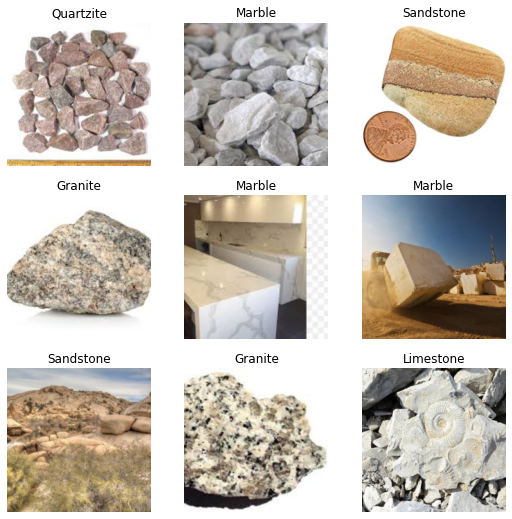

In [9]:
dls.show_batch()

In [12]:
learn = vision_learner(dls, resnet34, metrics=[error_rate, F1Score(average='macro')])

SuggestedLRs(valley=0.0012022644514217973)

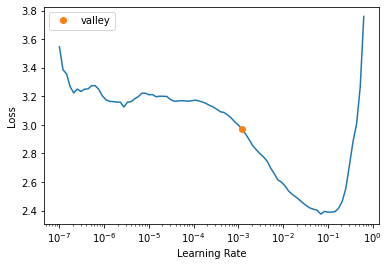

In [13]:
learn.lr_find()

epoch,train_loss,valid_loss,error_rate,f1_score,time
0,2.896893,2.014578,0.702910,0.280664,00:26
1,2.502623,1.439869,0.513017,0.445567,00:23
2,2.061586,1.117618,0.379786,0.572284,00:27
3,1.682771,1.008115,0.336907,0.615119,00:23
4,1.408010,1.003190,0.321593,0.641786,00:25
5,1.181659,0.983861,0.309341,0.653598,00:25
6,1.009529,0.997473,0.309341,0.663885,00:25
7,0.859652,0.992710,0.316998,0.656697,00:25
8,0.724609,0.938581,0.287902,0.688727,00:23
9,0.637973,1.002400,0.300153,0.665821,00:25


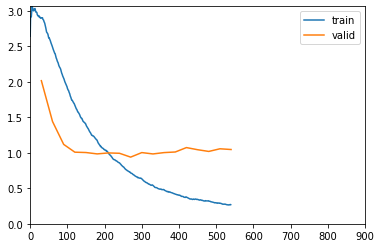

epoch,train_loss,valid_loss,error_rate,f1_score,time
0,2.896893,2.014578,0.702910,0.280664,00:26
1,2.502623,1.439869,0.513017,0.445567,00:23
2,2.061586,1.117618,0.379786,0.572284,00:27
3,1.682771,1.008115,0.336907,0.615119,00:23
4,1.408010,1.003190,0.321593,0.641786,00:25
5,1.181659,0.983861,0.309341,0.653598,00:25
6,1.009529,0.997473,0.309341,0.663885,00:25
7,0.859652,0.992710,0.316998,0.656697,00:25
8,0.724609,0.938581,0.287902,0.688727,00:23
9,0.637973,1.002400,0.300153,0.665821,00:25


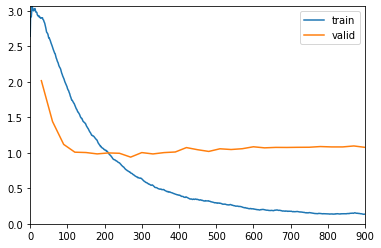

In [14]:
learn.fit_one_cycle(30, 0.0012, cbs=[ShowGraphCallback()])  #  cutmix

epoch,train_loss,valid_loss,error_rate,f1_score,time
0,0.132175,1.210061,0.298622,0.682858,00:23


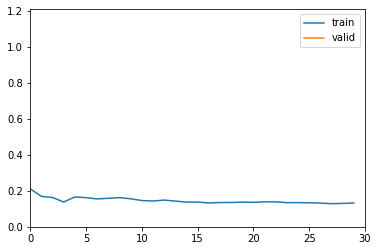

epoch,train_loss,valid_loss,error_rate,f1_score,time
0,0.175602,1.186378,0.281776,0.695761,00:26
1,0.178257,1.224588,0.275651,0.700701,00:25
2,0.209636,1.272601,0.295559,0.690027,00:26
3,0.219535,1.411214,0.275651,0.701269,00:26


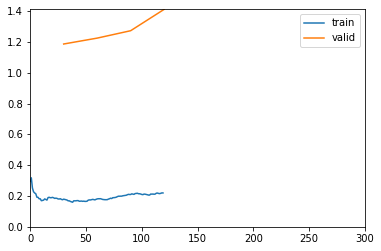

epoch,train_loss,valid_loss,error_rate,f1_score,time
0,0.175602,1.186378,0.281776,0.695761,00:26
1,0.178257,1.224588,0.275651,0.700701,00:25
2,0.209636,1.272601,0.295559,0.690027,00:26
3,0.219535,1.411214,0.275651,0.701269,00:26
4,0.202083,1.282342,0.264931,0.712864,00:24
5,0.158248,1.195032,0.251149,0.726814,00:26
6,0.124900,1.263097,0.275651,0.696723,00:26
7,0.089313,1.242459,0.271057,0.708608,00:24
8,0.065042,1.229147,0.267994,0.710947,00:27
9,0.049381,1.236579,0.267994,0.711735,00:24


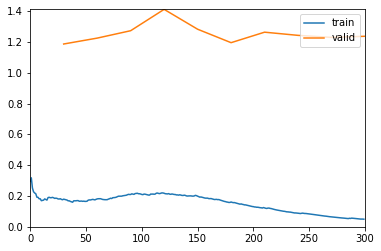

In [15]:
learn.fine_tune(10, cbs=ShowGraphCallback())

In [16]:
learn.predict(dls.valid_ds.items[0])

('Quartzite',
 TensorBase(5),
 TensorBase([1.4041e-01, 8.9621e-02, 1.6473e-04, 1.8166e-05, 1.1103e-02,
             7.5859e-01, 9.7567e-05]))


Sample Results:


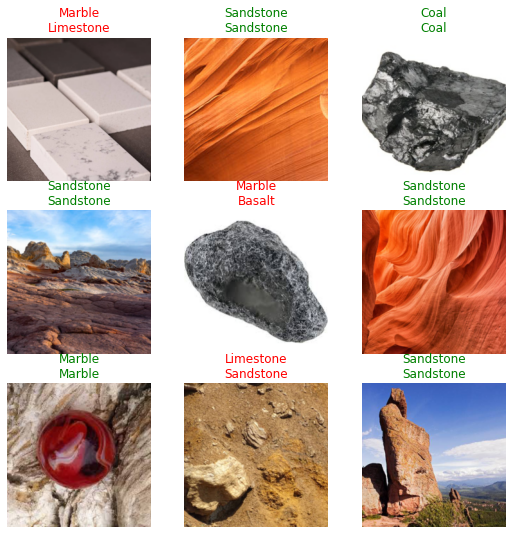


Top losses:-


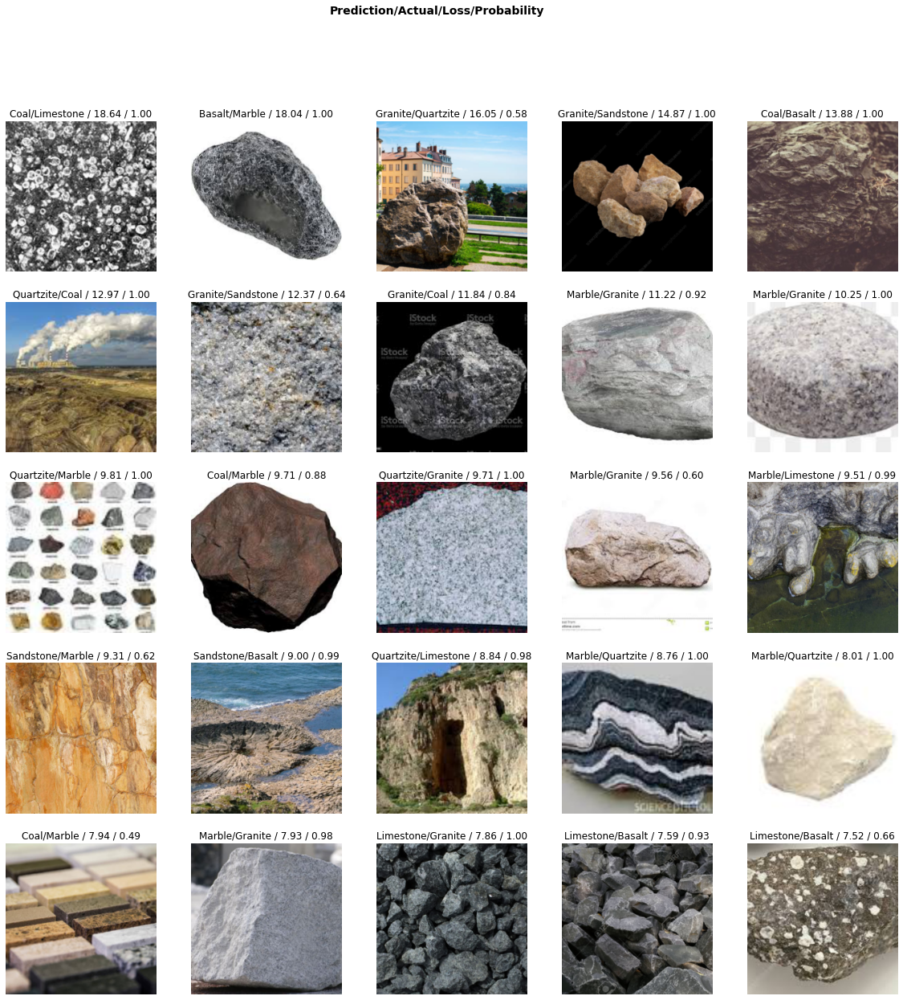


Confusion Matrix:-


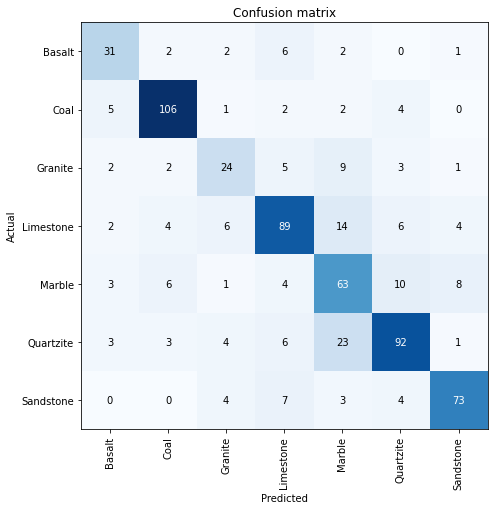


Normalized Confusion Matrix:-


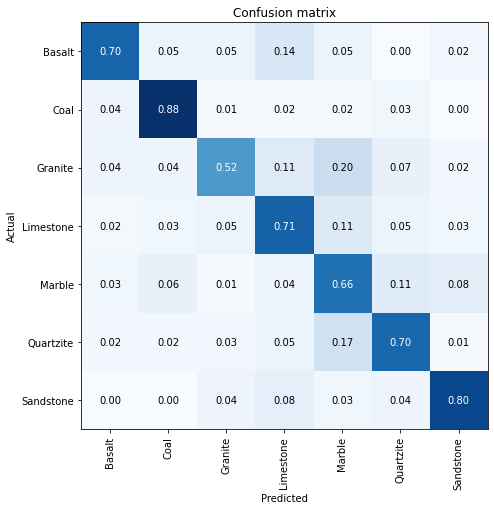

In [17]:
losses = get_results(learn)

In [ ]:
# print(losses.T[2].apply(str)[:15])
for path in losses.T[2].apply(str):
    print(path)

In [ ]:
# # save model
# learn.export(file='model.pkl')

# learn = load_learner('model.pkl')

## Without removing bad images + basic data augmentation

In [3]:
dls = ImageDataLoaders.from_folder(path='data/2_processed/', valid_pct=0.25,
                                   item_tfms=Resize(460),
                                   batch_tfms=aug_transforms(size=224))
dls.valid_ds.items[:3]

[Path('data/2_processed/Marble/dataset1_Marble_317_istockphoto-1195174656-612x612.jpg'),
 Path('data/2_processed/Marble/dataset2_Marble_396_marble rock16.jpg'),
 Path('data/2_processed/Sandstone/dataset2_Sandstone_339_Sandstone156.jpg')]

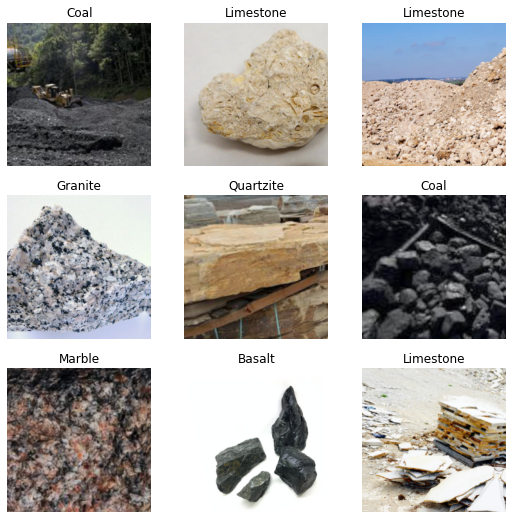

In [4]:
dls.show_batch()

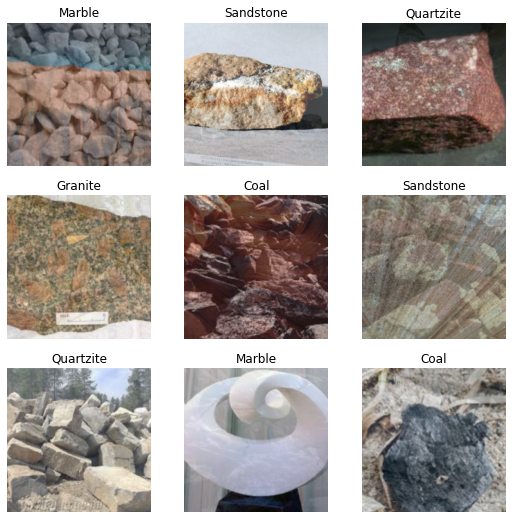

In [5]:
mixup = MixUp(1.)
with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=mixup) as learn:
    learn.epoch,learn.training = 0,True
    learn.dl = dls.train
    b = dls.one_batch()
    learn._split(b)
    learn('before_train')
    learn('before_batch')

_,axs = plt.subplots(3,3, figsize=(9,9))
dls.show_batch(b=(mixup.x,mixup.y), ctxs=axs.flatten())

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


SuggestedLRs(valley=0.0010000000474974513)

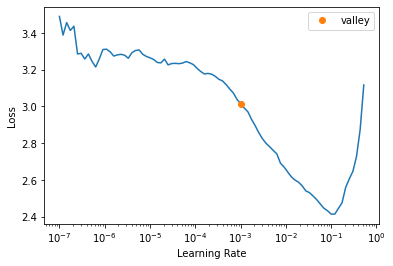

In [6]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), 
                       metrics=[accuracy, error_rate, F1Score(average='macro')])

learn.lr_find()

epoch,train_loss,valid_loss,accuracy,error_rate,f1_score,time
0,3.076926,1.951989,0.303216,0.696784,0.281431,00:34
1,2.792738,1.466455,0.465544,0.534456,0.412426,00:30
2,2.497262,1.225388,0.574273,0.425727,0.517448,00:30
3,2.267936,1.110398,0.612557,0.387443,0.566547,00:29
4,2.090410,1.063282,0.635528,0.364472,0.602694,00:31
5,1.977393,1.065328,0.649311,0.350689,0.611650,00:32
6,1.867555,1.025021,0.667688,0.332312,0.633076,00:30
7,1.764784,0.946497,0.673813,0.326187,0.643317,00:29
8,1.669997,0.958440,0.669219,0.330781,0.624928,00:31
9,1.586275,0.925740,0.684533,0.315467,0.661738,00:30


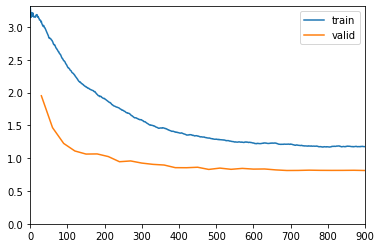

In [7]:
learn.fit_one_cycle(30, 0.0014, cbs=[mixup, ShowGraphCallback()])  #  cutmix

In [ ]:
learn.fine_tune(10, 1e-4)

epoch,train_loss,valid_loss,accuracy,error_rate,f1_score,time
0,0.665746,0.802906,0.736600,0.263400,0.711817,00:31


epoch,train_loss,valid_loss,accuracy,error_rate,f1_score,time
0,0.622999,0.801419,0.739663,0.260337,0.714582,00:31
1,0.627208,0.785583,0.738132,0.261868,0.712305,00:33
2,0.623970,0.770671,0.733537,0.266462,0.707888,00:30
3,0.599673,0.758421,0.730475,0.269525,0.703868,00:31
4,0.587795,0.747785,0.741194,0.258806,0.716967,00:31
5,0.577832,0.744137,0.736600,0.263400,0.709718,00:32
6,0.563504,0.739655,0.735069,0.264931,0.707695,00:29
7,0.550807,0.735979,0.741194,0.258806,0.714289,00:34



Sample Results:


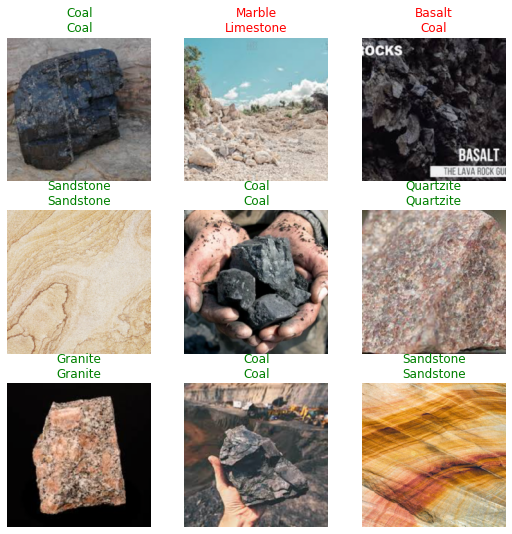


Top losses:-


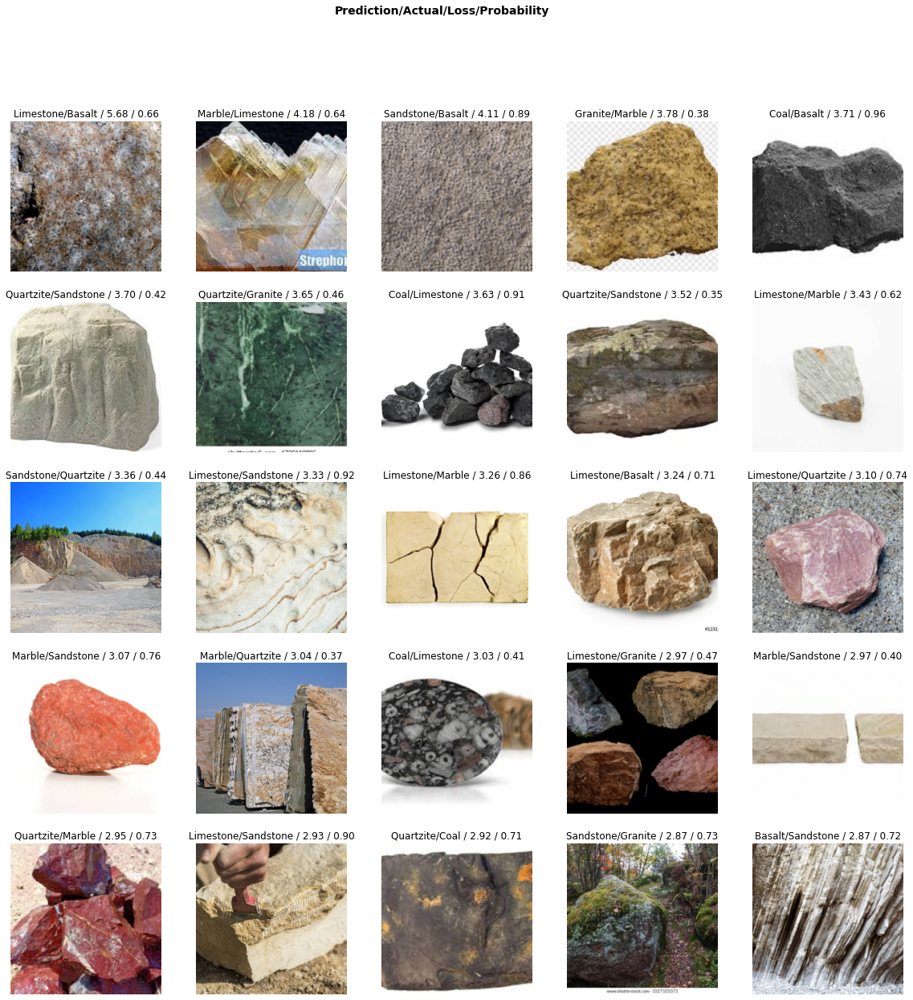


Confusion Matrix:-


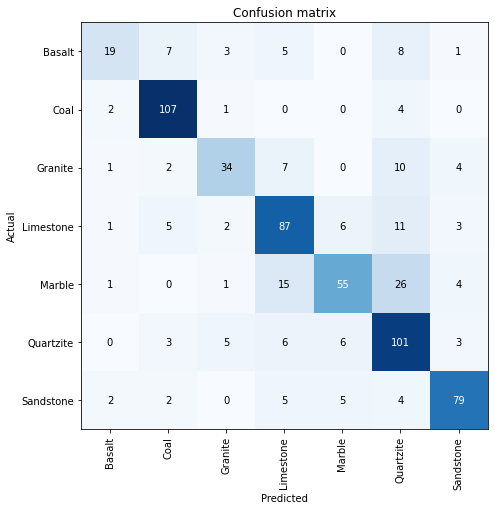


Normalized Confusion Matrix:-


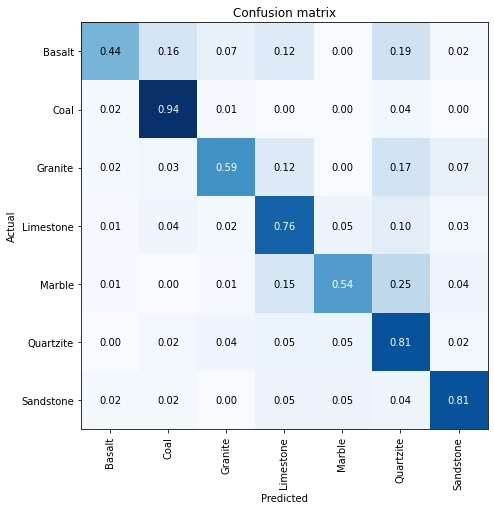

In [9]:
losses = get_results(learn)

## Using Data Augmentation and after removing bad

In [31]:
!rocks_download_data
!rocks_process_data --config-dir configs\
                    remove_bad=True\
                    remove_misclassified=True\
                    remove_duplicates=True\
                    remove_corrupted=True\
                    remove_unsupported=True\

Function 'run_scripts' executed in 4.8794s
Moving files from dataset1/Basalt and dataset2/Basalt to data/2_processed/Basalt ...
Moving files from dataset1/Coal and dataset2/Coal to data/2_processed/Coal ...
Moving files from dataset1/Granite and dataset2/Granite to data/2_processed/Granite ...
Moving files from dataset1/Limestone and dataset2/Limestone to data/2_processed/Limestone ...
Moving files from dataset1/Marble and dataset2/Marble to data/2_processed/Marble ...
Moving files from dataset1/Quartzite and dataset2/Quartzite to data/2_processed/Quartzite ...
Moving files from dataset1/Sandstone and dataset2/Sandstone to data/2_processed/Sandstone ...


Files other than jpg and png.

data/2_processed/Coal/dataset1_Coal_025_12.jpeg
data/2_processed/Coal/dataset1_Coal_070_162.jpeg
data/2_processed/Coal/dataset1_Coal_071_163.jpeg
data/2_processed/Coal/dataset1_Coal_072_164.jpeg
data/2_processed/Coal/dataset1_Coal_073_165.jpeg
data/2_processed/Coal/dataset1_Coal_074_166.jpeg
data/2_proce

In [32]:
dls = ImageDataLoaders.from_folder(path='data/2_processed/', valid_pct=0.25,
                                   item_tfms=Resize(460),
                                   batch_tfms=aug_transforms(size=224))
dls.valid_ds.items[:3]

[Path('data/2_processed/Limestone/dataset2_Limestone_430_Limestone65.jpg'),
 Path('data/2_processed/Quartzite/dataset1_Quartzite_352_images(430).jpg'),
 Path('data/2_processed/Limestone/dataset1_Limestone_266_337.jpg')]

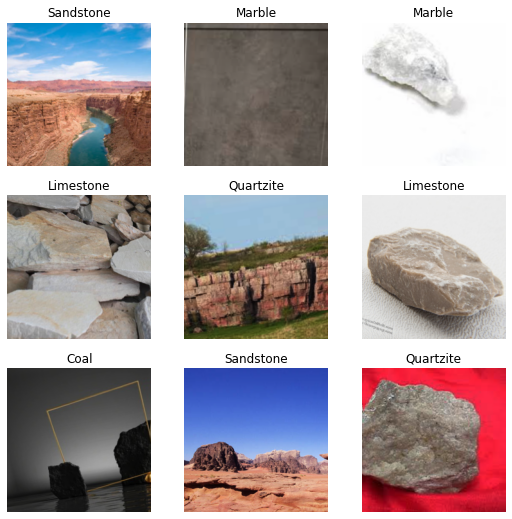

In [33]:
dls.show_batch()

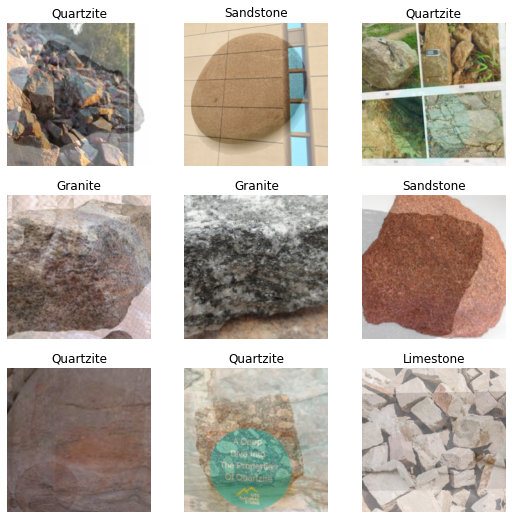

In [34]:
mixup = MixUp(1.)
with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=mixup) as learn:
    learn.epoch,learn.training = 0,True
    learn.dl = dls.train
    b = dls.one_batch()
    learn._split(b)
    learn('before_train')
    learn('before_batch')

_,axs = plt.subplots(3,3, figsize=(9,9))
dls.show_batch(b=(mixup.x,mixup.y), ctxs=axs.flatten())

/usr/local/lib/python3.7/dist-packages/fastai/callback/mixup.py:107: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  x1 = torch.clamp(cx - cut_w // 2, 0, W)
/usr/local/lib/python3.7/dist-packages/fastai/callback/mixup.py:108: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y1 = torch.clamp(cy - cut_h // 2, 0, H)
/usr/local/lib/python3.7/d

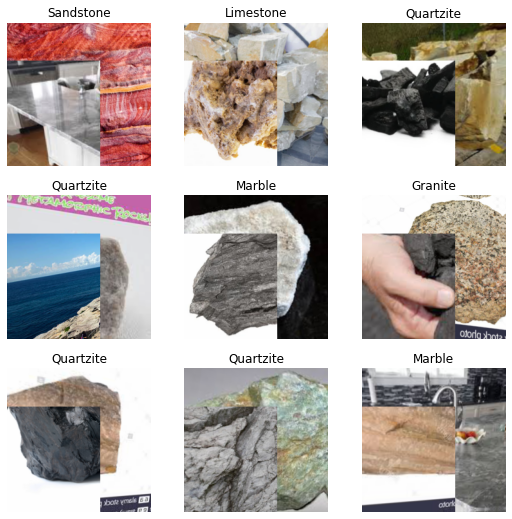

In [41]:
cutmix = CutMix(1.)
with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=cutmix) as learn:
    learn.epoch,learn.training = 0,True
    learn.dl = dls.train
    b = dls.one_batch()
    learn._split(b)
    learn('before_train')
    learn('before_batch')

_,axs = plt.subplots(3,3, figsize=(9,9))
dls.show_batch(b=(cutmix.x,cutmix.y), ctxs=axs.flatten())

In [44]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), 
                       metrics=[accuracy, error_rate, F1Score(average='macro')])
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,error_rate,f1_score,time
0,2.587026,1.069830,0.624454,0.375546,0.545059,00:23
1,2.254530,0.808657,0.753275,0.246725,0.692703,00:21
2,2.003025,0.673391,0.775109,0.224891,0.721851,00:24
3,1.822429,0.663911,0.779476,0.220524,0.696597,00:25
4,1.662388,0.657548,0.772926,0.227074,0.719969,00:23
5,1.508256,0.527801,0.838428,0.161572,0.801828,00:23
6,1.408419,0.521971,0.842795,0.157205,0.808499,00:21
7,1.310668,0.487112,0.842795,0.157205,0.804636,00:23
8,1.234066,0.488447,0.842795,0.157205,0.815937,00:21
9,1.178964,0.506636,0.840611,0.159389,0.795700,00:23


In [ ]:
learn.fit_one_cycle(20, 0.005, cbs=[mixup, ShowGraphCallback()])  #  cutmix

In [45]:
learn.fine_tune(5, 1e-4)

epoch,train_loss,valid_loss,accuracy,error_rate,f1_score,time
0,0.380499,0.428592,0.899563,0.100437,0.879106,00:23


epoch,train_loss,valid_loss,accuracy,error_rate,f1_score,time
0,0.346381,0.425303,0.903930,0.096070,0.883906,00:22
1,0.343592,0.399644,0.901747,0.098253,0.882043,00:23
2,0.322625,0.384890,0.899563,0.100437,0.878995,00:23
3,0.305831,0.377739,0.903930,0.096070,0.884631,00:22
4,0.299308,0.378621,0.903930,0.096070,0.884631,00:23


    learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), 
                        metrics=[accuracy, error_rate, F1Score(average='macro')])
                        
    learn.fit_one_cycle(20, 0.0005, cbs=[mixup])  #  cutmix

    learn.fine_tune(20, 1e-3)


    epoch	train_loss	valid_loss	error_rate
        7	0.237079	0.317056	0.11658

#### Interpretation of predictions


Sample Results:


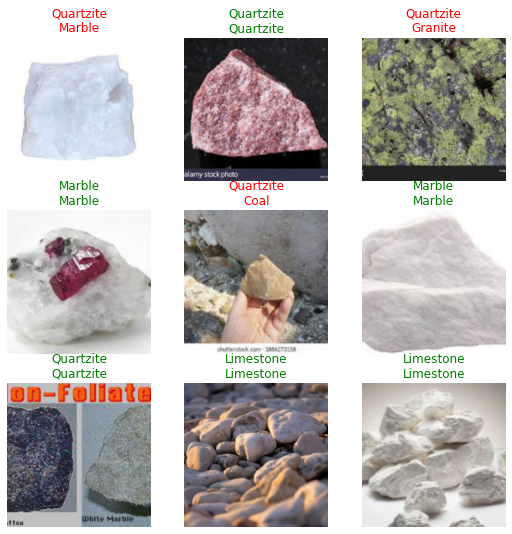


Top losses:-


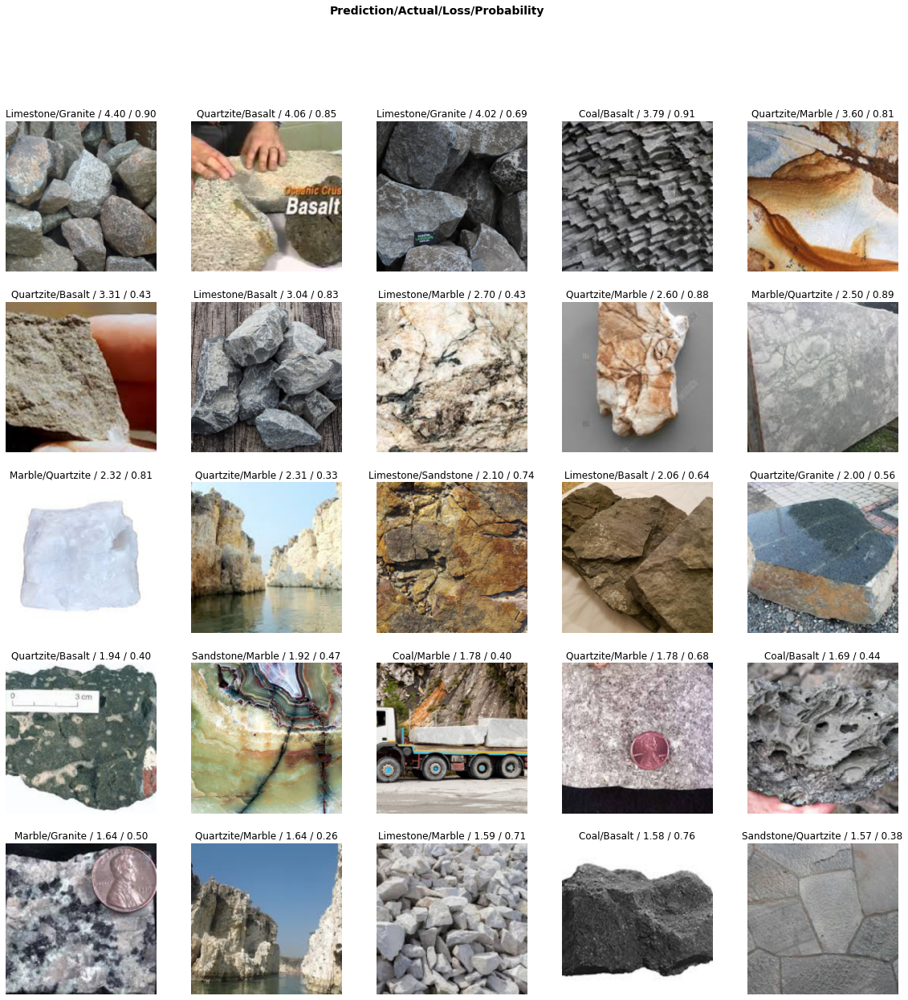


Confusion Matrix:-


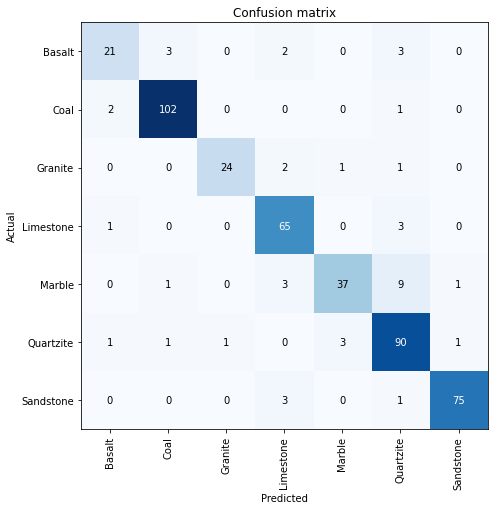


Normalized Confusion Matrix:-


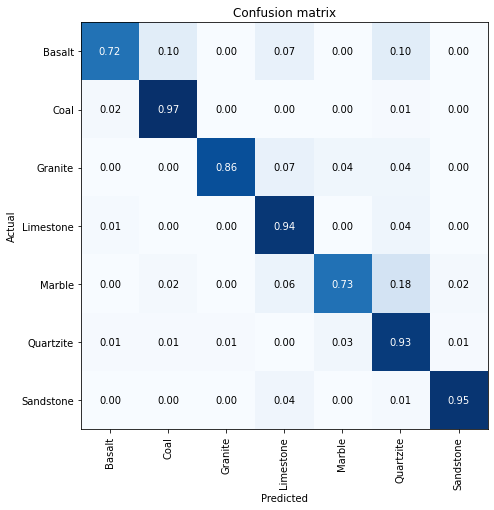

In [46]:
losses = get_results(learn)

In [ ]:
# print(losses.T[2].apply(str)[:15])
for path in losses.T[2].apply(str):
    if 'Marble' in path:
      print(path)

data/2_processed/Marble/dataset1_Marble_219_1 (574).jpg
data/2_processed/Marble/dataset1_Marble_155_1 (469).jpg
data/2_processed/Marble/dataset1_Marble_021_1 (30).jpg
data/2_processed/Marble/dataset1_Marble_354_istockphoto-591405034-612x612.jpg
data/2_processed/Marble/dataset1_Marble_287_istockphoto-1030995030-612x612.jpg
data/2_processed/Marble/dataset1_Marble_040_1 (349).jpg
data/2_processed/Marble/dataset1_Marble_278_White-Marble-Metamorphic-Rock.jpg
data/2_processed/Marble/dataset1_Marble_273_Marble-084-RD010-C-SH_nltxub.jpg
data/2_processed/Marble/dataset1_Marble_317_istockphoto-1195174656-612x612.jpg
data/2_processed/Marble/dataset1_Marble_248_1 (602).jpg
data/2_processed/Marble/dataset1_Marble_172_1 (496).jpg
data/2_processed/Marble/dataset1_Marble_110_1 (416).jpg
data/2_processed/Marble/dataset1_Marble_218_1 (573).jpg
data/2_processed/Marble/dataset1_Marble_280_e9445d48-36f0-4ecf-b097-96ed445a9f74.__CR255,99,3210,1985_PT0_SX970_V1___.jpg
data/2_processed/Marble/dataset1_Marble_